In [1]:
import pandas as pd
import missingno as msno
import numpy as np
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_rows', None)

In [2]:
def get_dataframe_info(df, ascending=False, count_percentage=False):
    """
    Parameters :
      - df : pd.DataFrame
      - ascending : Bool 
    output
      df_null_counts -> DataFrame Info (sorted)
    """
    column_names = ['Column', 'Dtype', 'Non-null Count']
    df_types = pd.DataFrame(df.dtypes)
    df_nulls = df.count() 
    if count_percentage : 
        df_nulls *= 100.0 / df.shape[0]
        column_names[-1] += ' (%)'
    
    df_null_count = pd.concat([df_types, df_nulls], axis=1)
    df_null_count = df_null_count.reset_index()
    
    # Reassign column names
    
    df_null_count.columns = column_names

    # Add this to sort
    df_null_count = df_null_count.sort_values(by=column_names[-1], ascending=ascending)
    
    return df_null_count

def astype_inplace(df, **kwargs):
    for col, dtype in kwargs.items():
        df.loc[:,col] = df[col].astype(dtype)

def outliers_thresold(df, columns):

    Q1 = df[columns].apply(lambda x : x.quantile(q=0.25), axis=0)#, result_type='broadcast')
    Q3 = df[columns].apply(lambda x : x.quantile(q=0.75), axis=0)#result_type='broadcast')
    Q2 = df[columns].apply(lambda x : x.quantile(q=0.5), axis=0)#result_type='broadcast')

    IQR = Q3 - Q1
    threshold = Q2 + 1.5*IQR 

    return pd.DataFrame(threshold).transpose()

In [3]:
file = 'fr.openfoodfacts.org.products.csv'

In [4]:
df = pd.read_csv(file, delimiter='\t', low_memory=False)
df.shape

(320772, 162)

<Axes: >

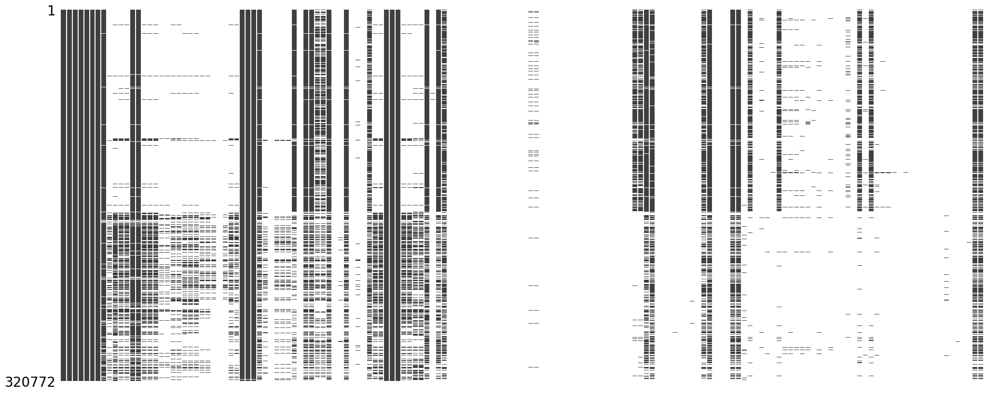

In [5]:
msno.matrix(df, sparkline=False)

In [6]:
# Obtention des information de bases des données
df_info = get_dataframe_info(df, ascending=False, count_percentage=True)
df_info

,Column,Dtype,Non-null Count (%)
6,last_modified_datetime,object,100.000000
5,last_modified_t,object,100.000000
2,creator,object,99.999377
3,created_t,object,99.999065
4,created_datetime,object,99.997194
0,code,object,99.992830
1,url,object,99.992830
56,states,object,99.985660
58,states_fr,object,99.985660
57,states_tags,object,99.985660


In [7]:
df.dropna(subset=['code'], inplace=True)

In [8]:
# Supprime les colonne ayant trop peu de valeurs valides 
threshold = 3.5
df.drop(columns=df_info[df_info['Non-null Count (%)'] < threshold]['Column'], inplace=True)
df.shape

(320749, 77)

Le dataset est très éparse. Il y a beaucoup de valeur manquante et certaine colonnes n'ont pas du tout de valeurs. On remarque aussi que certaines colonnes n'ont pas le bon type de données. Les colones **created_datetime** et **last_modified_datetime** possèdent le dtype *Object* là où l'on aimerais avoir un dtype de *datatime64[ns]*

In [9]:
# Convertit les timestamp en float64
astype_inplace(df, created_t=np.float64)
astype_inplace(df, last_modified_t=np.float64)
df['created_t'] = df['created_t'].apply(pd.to_numeric)

In [10]:
# Convertit columns to datetime64[ns] dtype
df['created_datetime']       = pd.to_datetime(df['created_datetime']      , format='%Y-%m-%dT%H:%M:%SZ')
df['last_modified_datetime'] = pd.to_datetime(df['last_modified_datetime'], format='%Y-%m-%dT%H:%M:%SZ')


In [11]:
# Test si les timestamps created_t sont équivalent au dates created_datetime:
(pd.to_datetime(df['created_t'], unit='s') == df['created_datetime']).value_counts()
# une date est manquante

True     320748
False         1
Name: count, dtype: int64

In [12]:
# Test si les timestamps last_modified_t sont équivalent au dates last_modified_datetime:
(pd.to_datetime(df['last_modified_t'], unit='s') == df['last_modified_datetime']).value_counts()

True    320749
Name: count, dtype: int64

In [13]:
df.loc[df['created_datetime'].isna(), 'created_datetime'] = pd.to_datetime(df.loc[df['created_datetime'].isna(), 'created_t'], unit='s')

In [14]:
(df['created_datetime'] <= df['last_modified_datetime']).value_counts(dropna=False)

True    320749
Name: count, dtype: int64

In [15]:
df[['created_datetime', 'last_modified_datetime']].head() 

,created_datetime,last_modified_datetime
0,2016-09-17 09:17:46,2016-09-17 09:18:13
1,2017-03-09 14:32:37,2017-03-09 14:32:37
2,2017-03-09 14:32:37,2017-03-09 14:32:37
3,2017-03-09 10:35:31,2017-03-09 10:35:31
4,2017-03-09 10:34:13,2017-03-09 10:34:13


In [16]:
df[['created_datetime', 'last_modified_datetime']].tail() 

,created_datetime,last_modified_datetime
320767,2017-03-27 16:14:59,2017-04-03 18:34:58
320768,2017-03-09 11:31:16,2017-04-03 18:34:59
320769,2015-01-24 11:36:17,2017-04-03 18:34:59
320770,2017-04-16 10:54:49,2017-04-16 10:54:49
320771,2017-03-09 15:18:29,2017-04-03 18:34:59


In [17]:
df.drop(columns=['created_t', 'last_modified_t'], inplace=True)

In [18]:
df_info = get_dataframe_info(df, ascending=False, count_percentage=True)
df_info

,Column,Dtype,Non-null Count (%)
0,code,object,100.000000
1,url,object,100.000000
3,created_datetime,datetime64[ns],100.000000
4,last_modified_datetime,datetime64[ns],100.000000
2,creator,object,99.999376
47,states,object,99.992829
49,states_fr,object,99.992829
48,states_tags,object,99.992829
29,countries_tags,object,99.912704
30,countries_fr,object,99.912704


#### Les dtypes sont maintenant cohérents avec les types de données
Avant d'addresser le problème des valeurs manquantes on doit mieux sélectionner les colonnes qui nous intéresse.

## Question 1

Pour évaluer si un aliment est sain, plusieurs critères clés doivent être pris en compte. Tout d'abord, les informations nutritionnelles, synthétisées par le Nutri-Score, nous renseignent sur la densité énergétique, la répartition des macronutriments (protéines, glucides, lipides), ainsi que sur les éléments à surveiller comme les graisses saturées, les sucres ajoutés et le sel. Le Nutri-Score, qui va de A à E, facilite la compréhension de ces informations pour le consommateur.
La liste des ingrédients constitue également une source précieuse d'information. Organisée par ordre décroissant de quantité, elle permet d'identifier rapidement la composition de l'aliment. Une liste courte avec des ingrédients reconnaissables est généralement préférable. Il convient d'être vigilant lorsque le sucre ou le sel apparaissent parmi les premiers ingrédients, et de privilégier les ingrédients complets plutôt que raffinés.
Les additifs alimentaires, reconnaissables à leur code "E" suivi d'un numéro, méritent une attention particulière. Bien que certains soient sans danger, d'autres sont controversés pour leurs effets potentiels sur la santé, notamment certains colorants artificiels, édulcorants et conservateurs comme les nitrites.
Le degré de transformation d'un aliment est également déterminant. Les aliments ultra-transformés, qui contiennent souvent de nombreux ingrédients industriels, sont généralement considérés comme moins sains que les aliments bruts ou peu transformés. Enfin, l'origine et le mode de production jouent un rôle important : les produits biologiques contiennent moins de résidus de pesticides, tandis que la fraîcheur et la saisonnalité peuvent influencer la qualité nutritionnelle. Le mode de conservation peut également avoir un impact sur la valeur nutritive des aliments.

Les colonnes importantes :
- nutrition-score-fr_100g: score nutritionnel français (base du Nutri-Score)
- additives_n: nombre d'additifs
- ingredients_from_palm_oil_n: nombre d'ingrédients contenant de l'huile de palme
- ingredients_that_may_be_from_palm_oil_n: nombre d'ingrédients pouvant contenir de l'huile de palme
    
Données nutritionnelles pour 100g/100ml:
- energy_100g: énergie en kJ
- fat_100g: matières grasses
- saturated-fat_100g: acides gras saturés
- carbohydrates_100g: glucides
- sugars_100g: sucres
- fiber_100g: fibres alimentaires
- proteins_100g: protéines
- salt_100g: sel
- sodium_100g: sodium

Autres informations importantes:
- labels_tags: labels (bio, commerce équitable, etc.)
- labels
- ingredients_text: liste des ingrédients
- allergens: allergènes
- traces: traces potentielles d'allergènes


In [19]:
columns_to_keep = ['code', 'creator', 'pnns_groups_1', 'pnns_groups_2', 'countries', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g', 'additives_n','ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g','sodium_100g', 'labels_tags','labels', 'ingredients_text', 'allergens', 'traces', 'nutrition_grade_fr', 'quantity']

In [20]:
df = df[columns_to_keep]

<Axes: >

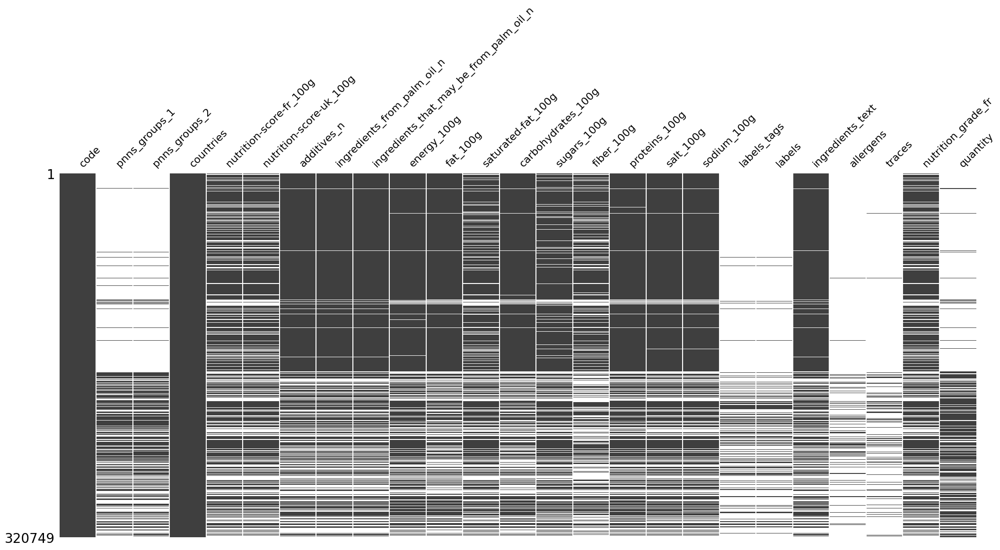

In [20]:
msno.matrix(df, sparkline=False)

<Axes: >

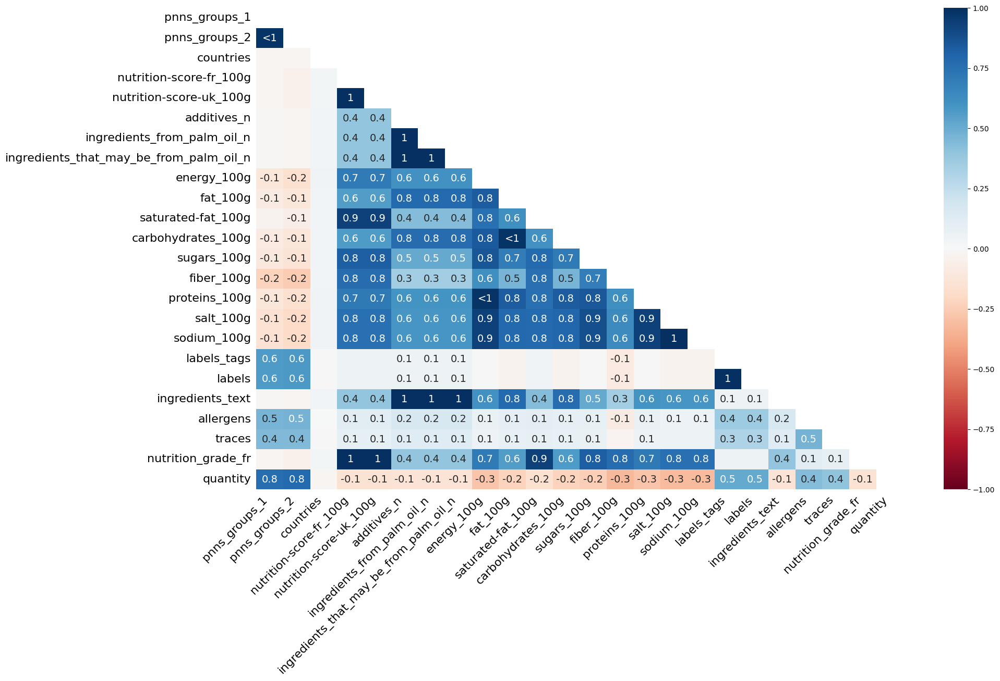

In [21]:
msno.heatmap(df)

In [23]:
df.drop(columns=['sodium_100g'], inplace=True)

In [24]:
df['pnns_groups_1'] = df['pnns_groups_1'].replace(to_replace=r'-', value=' ', regex=True)
df['pnns_groups_1'] = df['pnns_groups_1'].str.title()
df['pnns_groups_2'] = df['pnns_groups_2'].str.title()

In [25]:
df[['pnns_groups_1', 'pnns_groups_2']].groupby('pnns_groups_1', dropna=False).value_counts(dropna=False)

pnns_groups_1            pnns_groups_2                   
Beverages                Non-Sugared Beverages                 4302
                         Sweetened Beverages                   2170
                         Fruit Juices                          1924
                         Fruit Nectars                          376
                         Artificially Sweetened Beverages       261
Cereals And Potatoes     Cereals                               4118
                         Bread                                 1838
                         Breakfast Cereals                     1408
                         Legumes                                929
                         Potatoes                               165
Composite Foods          One-Dish Meals                        5546
                         Sandwich                               686
                         Pizza Pies And Quiche                  515
Fat And Sauces           Dressings And Sauces             

In [26]:
df.loc[df['pnns_groups_1'].isna() & (df['pnns_groups_2'] == 'Alcoholic Beverages'), 'pnns_groups_1'] = 'Beverages'
df.loc[df['pnns_groups_1'].isna() & (df['pnns_groups_2'] == 'Tripe Dishes'), 'pnns_groups_1'] = 'Fish Meat Eggs'

In [27]:
df.fillna({'ingredients_from_palm_oil_n': 0.0, 'ingredients_that_may_be_from_palm_oil_n': 0.0}, inplace=True)
df.fillna({'additives_n' : 0.0, 'labels' :'', 'labels_tags' : '', 'allergens' : '', 'traces' : '', 'ingredients_text' : ''}, inplace=True)

In [28]:
df.replace('Unknown', np.nan, inplace=True)
df.dropna(subset=['pnns_groups_1', 'nutrition_grade_fr'], inplace=True)
df_info = get_dataframe_info(df)
df_info

,Column,Dtype,Non-null Count
0,code,object,50704
1,pnns_groups_1,object,50704
2,pnns_groups_2,object,50704
4,nutrition-score-fr_100g,float64,50704
6,additives_n,float64,50704
5,nutrition-score-uk_100g,float64,50704
7,ingredients_from_palm_oil_n,float64,50704
8,ingredients_that_may_be_from_palm_oil_n,float64,50704
20,allergens,object,50704
19,ingredients_text,object,50704


<Axes: >

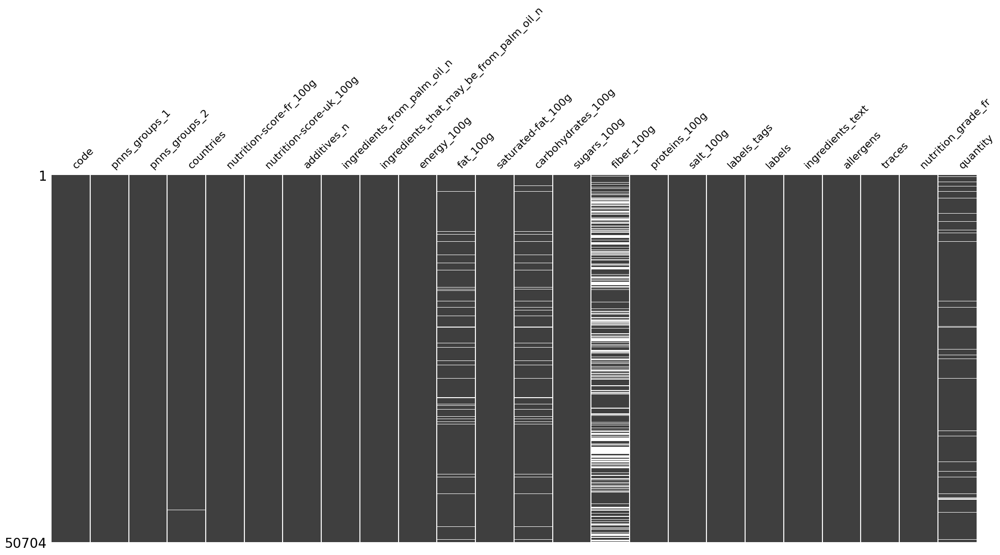

In [29]:
msno.matrix(df, sparkline=False)

# Question 2

In [30]:
df[['pnns_groups_1', 'pnns_groups_2']].groupby('pnns_groups_1', dropna=False).value_counts(dropna=False).sort_index()

pnns_groups_1            pnns_groups_2                   
Beverages                Alcoholic Beverages                   59
                         Artificially Sweetened Beverages     227
                         Fruit Juices                        1592
                         Fruit Nectars                        290
                         Non-Sugared Beverages               1876
                         Sweetened Beverages                 1712
Cereals And Potatoes     Bread                               1483
                         Breakfast Cereals                   1266
                         Cereals                             3315
                         Legumes                              661
                         Potatoes                              77
Composite Foods          One-Dish Meals                      4520
                         Pizza Pies And Quiche                449
                         Sandwich                             625
Fat And Sauces    

# Question 3


In [31]:
df[['pnns_groups_1', 'pnns_groups_2', 'nutrition_grade_fr']].groupby(['pnns_groups_1', 'pnns_groups_2'], dropna=False).min()

nutrition_grade_fr
pnns_groups_1           pnns_groups_2                                      
Beverages               Alcoholic Beverages                               b
                        Artificially Sweetened Beverages                  a
                        Fruit Juices                                      b
                        Fruit Nectars                                     b
                        Non-Sugared Beverages                             a
                        Sweetened Beverages                               a
Cereals And Potatoes    Bread                                             a
                        Breakfast Cereals                                 a
                        Cereals                                           a
                        Legumes                                           a
                        Potatoes                                          a
Composite Foods         One-Dish Meals                                    a
                        Pizza Pies And Quiche                             a
                        Sandwich                                          a
Fat And Sauces          Dressings And Sauces                              a
                        Fats                                              a
Fish Meat Eggs          Eggs                                              a
                        Fish And Seafood                                  a
                        Meat                                              a
                        Processed Meat                                    a
                        Tripe Dishes                                      a
Fruits And Vegetables   Dried Fruits                                      a
                        Fruits                                            a
                        Soups                                             a
                        Vegetables                                        a
Milk And Dairy Products Cheese                                            a
                        Dairy Desserts                                    a
                        Ice Cream                                         a
                        Milk And Yogurt                                   a
Salty Snacks            Appetizers                                        a
                        Nuts                                              a
                        Salty And Fatty Products                          a
Sugary Snacks           Biscuits And Cakes                                a
                        Chocolate Products                                a
                        Pastries                                          b
                        Sweets                                            a

## Question 7

In [32]:
df[(df['ingredients_from_palm_oil_n'] > 0) | (df['ingredients_that_may_be_from_palm_oil_n'] > 0)][['pnns_groups_1', 'pnns_groups_2']].groupby('pnns_groups_1').value_counts()

pnns_groups_1            pnns_groups_2                   
Beverages                Sweetened Beverages                  120
                         Non-Sugared Beverages                 48
                         Artificially Sweetened Beverages      21
                         Fruit Nectars                         11
                         Fruit Juices                           8
Cereals And Potatoes     Bread                                494
                         Breakfast Cereals                    330
                         Cereals                              176
                         Legumes                               18
                         Potatoes                              14
Composite Foods          One-Dish Meals                       590
                         Sandwich                             355
                         Pizza Pies And Quiche                128
Fat And Sauces           Dressings And Sauces                 211
                  

In [33]:
# Proportion d'aliments contentant de l'huile de palme

df[(df['ingredients_from_palm_oil_n'] > 0) | (df['ingredients_that_may_be_from_palm_oil_n'] > 0)].shape[0]/df.shape[0]*100

13.778005680025244

In [36]:
#(df['salt_100g'] >= df['sodium_100g']).value_counts(dropna=False)

In [37]:
#df[df['sodium_100g'] >= 100]['sodium_100g'].value_counts()

In [39]:
#df.dropna(subset=['salt_100g']).loc[df['salt_100g'] >= 100, 'sodium_100g']

<Axes: >

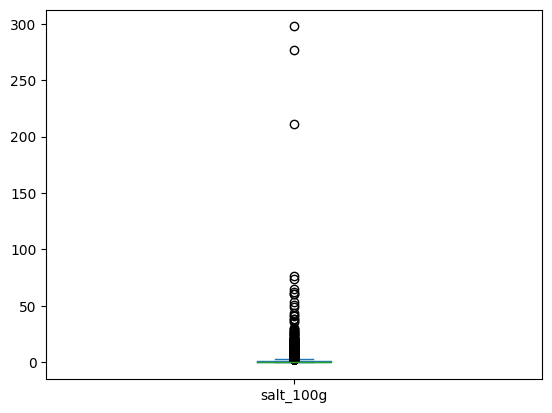

In [40]:
df.dropna(subset=['salt_100g'])['salt_100g'].plot(kind='box')

In [42]:
#df.plot(y='sodium_100g', kind='box')

<Axes: xlabel='salt_100g', ylabel='Count'>

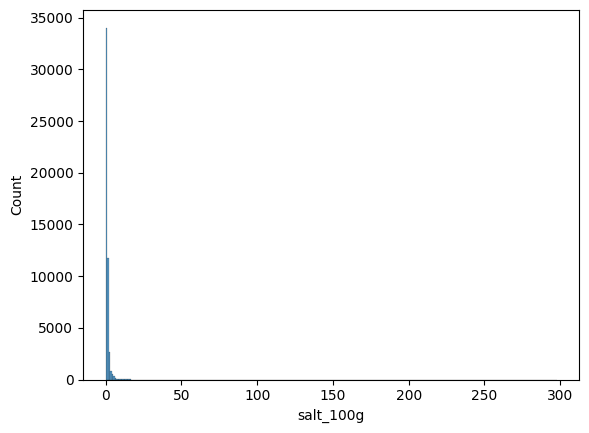

In [43]:
sns.histplot(data=df, x="salt_100g", binwidth=1)

Text(0.5, 0, 'Quantité (g)')

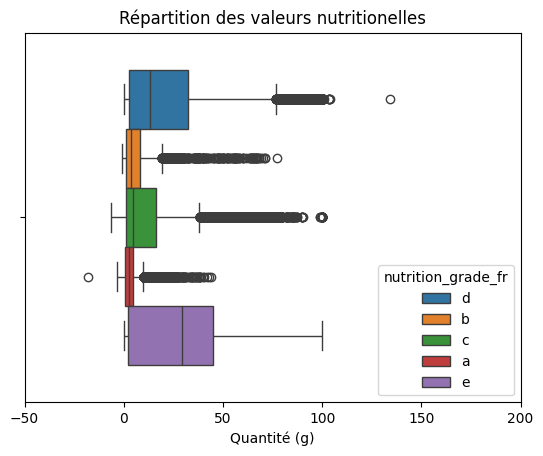

In [16]:
columns = ['nutrition_grade_fr', 'energy_100g', 'fat_100g', 'saturated-fat_100g','carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g']

figure = sns.boxplot(df[columns], x='sugars_100g', hue='nutrition_grade_fr', orient='h')
figure.set_xlim((-50, 200))
figure.set_title('Répartition des valeurs nutritionelles')
figure.set_xlabel('Quantité (g)')

In [ ]:
df.loc[out_idx, ['salt_100g', 'quantity']]

In [ ]:
df.loc[out_idx, ['salt_100g', 'quantity'] ].value_counts()

In [ ]:
import sklearn
from sklearn.impute import KNNImputer
from sklearn import preprocessing 
from sklearn.preprocessing import StandardScaler
sklearn.set_config(transform_output="pandas")

label_encoder = preprocessing.LabelEncoder()
imputation_cols = ['pnns_groups_1', 'pnns_groups_2', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g', 'additives_n','ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g','sodium_100g']

df_X = df[imputation_cols]

In [ ]:
df_X.loc[:,'pnns_groups_1'] = label_encoder.fit_transform(df_X['pnns_groups_1'].values)
df_X.loc[:,'pnns_groups_2'] = label_encoder.fit_transform(df_X['pnns_groups_2'].values)

df_X=df_X.apply(pd.to_numeric, errors='coerce')
get_dataframe_info(df_X)

In [ ]:
scalerX = StandardScaler().fit(df_X)
df_Xs   = scalerX.transform(df_X)

imputer = KNNImputer(n_neighbors=5)
df_Xs = imputer.fit_transform(df_Xs)
get_dataframe_info(df_Xs)

In [ ]:
get_dataframe_info(df_Xs, ascending=False, count_percentage=True)

In [ ]:
df_X = pd.DataFrame(scalerX.inverse_transform(df_Xs))
df_X.columns = df_Xs.columns
df_X.describe()

In [ ]:
#numeric_columns = df.select_dtypes(include=float).columns.to_list()

numeric_columns = ['energy_100g', 'fat_100g', 'saturated-fat_100g','carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g']

df_thr = outliers_thresold(df_X, numeric_columns)

In [ ]:
msno.matrix(df_X, sparkline=False)

In [ ]:
for column in numeric_columns:
    print(column, len(df_X[df_X[column] > df_thr[column].values[0]].index))

In [ ]:
for column in numeric_columns:
    df_X.drop(df_X[df_X[column] > df_thr[column].values[0]].index, inplace=True)

In [ ]:
df_X.shape

In [ ]:
#url_list = df['url'].str.split('/').str[4]

In [ ]:
#no_dup = url_list.drop_duplicates()

In [ ]:
#url_list.shape

In [ ]:
#no_dup.shape

In [ ]:
#code_list = df['code']
#no_code = code_list.drop_duplicates()

In [ ]:
#code_list.shape

In [ ]:
#no_code.shape

In [ ]:
#falsss = code_list != url_list

In [ ]:
#df[falsss]

In [ ]:
df_X.reset_index(inplace=True)

df_X.plot(kind='box', y='salt_100g')

In [ ]:
sns.boxplot(df_X['energy_100g'])

# Question 5

In [ ]:
df['allergens_n'] = df.reset_index()['allergens'].str.lower().str.split(',').apply(lambda x : len(set(x))  if x is not None and len(x[0]) > 0 else 0)

In [ ]:
df_count_allergens = df[['pnns_groups_1', 'pnns_groups_2', 'allergens_n']].groupby(['pnns_groups_1', 'pnns_groups_2']).mean().fillna(0)

df_count_allergens.reset_index(inplace=True)
df_count_allergens.sort_values(by=['pnns_groups_1', 'allergens_n'], ascending=True).groupby(['pnns_groups_1', 'pnns_groups_2', 'allergens_n'], sort=False).count()

# Question 8

In [ ]:
df.reset_index(inplace=True)

df['ingredients_text'].str.lower().str.split(',')

# Question 9

In [ ]:
df_X.head()

In [ ]:
df_salt = df_X[['pnns_groups_1', 'pnns_groups_2', 'salt_100g']]#.sort_values(by=['pnns_groups_1', 'pnns_groups_2'])

sns.boxplot(df_salt, orient='h')

In [44]:
df['creator'].value_counts()

creator
usda-ndb-import               169868
openfoodfacts-contributors     40117
kiliweb                        13891
date-limite-app                11918
openfood-ch-import             11478
tacite                          7214
sebleouf                        5864
tacinte                         4398
javichu                         2768
stephane                        2691
teolemon                        2334
agamitsudo                      2042
twoflower                       1916
jeanbono                        1879
foodorigins                     1649
segundo                         1460
miles67off                      1426
kyzh                            1202
aleene                          1039
kakao                            963
phoenix                          940
bleakpatch                       876
hangy                            842
bcatelin                         825
jacob80                          683
andre                            583
anticultist                   

In [61]:
a = df.loc[0, 'countries']

In [52]:
from country_named_entity_recognition import find_countries

In [62]:
find_countries(a)

[]

In [104]:
lang_tags = {}
country_list = set([])
def parse_list_countries(countries_list):
    for c in countries_list :
        c = c.strip()
        if ':' in c: 
            splitted_c = c.split(':')
            assert(len(splitted_c) == 2)
            lg, ct = splitted_c
            if len(ct) == 2:
                try :
                    lang_tags[lg].add(ct)
                except KeyError :
                    lang_tags[lg] = set([ct])
            else:
                country_list.add(c)
        else :
            country_list.add(c)



for index, row in df.dropna(subset=['countries']).iterrows():
    parse_list_countries(row["countries"].split(','))

In [105]:
lang_tags.keys()

dict_keys(['en', 'Other'])

In [106]:
len(country_list)

493

In [107]:
country_list

{'77-PROVINS',
 'ALLEMAGNE',
 'Aix-en-Provence',
 'Albania',
 'Alemanha',
 'Alemania',
 'Algeria',
 'Algerien',
 'Algérie',
 'Allemagne',
 'Andorra',
 'Andorre',
 'Angleterre',
 'Angola',
 'Arabie saoudite',
 'Argentina',
 'Argentine',
 'Armenien',
 'Arménie',
 'Aruba',
 'Australia',
 'Australie',
 'Australien',
 'Austria',
 'Autriche',
 'Azerbaijan',
 'Azərbaycan',
 'Belarus',
 'Belgica',
 'Belgien',
 'Belgique',
 'Belgium',
 'België',
 'Bosnia and Herzegovina',
 'Bouches du Rhône',
 'Bourgogne-Aube-Nogent sur Seine',
 'Brasil',
 'Brazil',
 'Brésil',
 'Bulgaria',
 'Bulgarie',
 'Burkina Faso',
 'Burundi',
 'Bélgica',
 'CANADA',
 'Cambodge',
 'Cambodia',
 'Cameroon',
 'Cameroun',
 'Canada',
 'Cehia',
 'Central African Republic',
 'Chile',
 'Chili',
 'China',
 'Chine',
 'Colombia',
 'Congo',
 'Cora',
 'Costa Rica',
 'Croatia',
 'Croácia',
 'Cuba',
 'Cyprus',
 'Czech',
 'Czech Republic',
 "Côte d'Ivoire",
 'Danemark',
 'Danmark',
 'Denemarken',
 'Denmark',
 'Deutschland',
 'Dinamarca',
 '

In [54]:
splitted_countries = df['countries'].dropna().str.split(',', expand=True).fillna('')

In [55]:
splitted_countries = splitted_countries.apply(lambda x: x.str.strip())

In [56]:
splitted_countries.loc[:, 0].value_counts()

0
US                                     169936
France                                  79525
en:FR                                   17240
Suisse                                  12388
Deutschland                              6271
España                                   3742
United Kingdom                           3355
United States                            2298
en:CH                                    2176
en:BE                                    1590
en:GB                                    1528
Australia                                1466
en:DE                                    1292
Belgique                                 1204
Россия                                   1155
en:ES                                     961
en:US                                     768
en:AU                                     651
Germany                                   625
en:IT                                     610
en:CA                                     593
Portugal                        

In [44]:
df.sort_values(by=['created_t'], ascending=True).reset_index(inplace=True)

KeyError: 'created_t'

In [163]:
df.dtypes

code                                           object
url                                            object
creator                                        object
created_t                                      object
created_datetime                               object
last_modified_t                                object
last_modified_datetime                         object
product_name                                   object
generic_name                                   object
quantity                                       object
packaging                                      object
packaging_tags                                 object
brands                                         object
brands_tags                                    object
categories                                     object
categories_tags                                object
categories_fr                                  object
origins                                        object
origins_tags                

<Axes: >

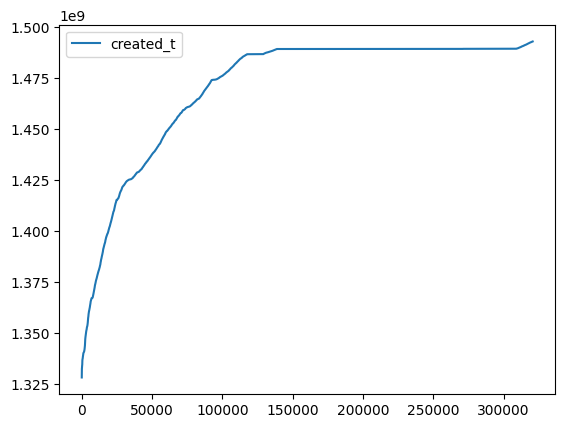

In [625]:
df[df['created_t'] > 0].sort_values(by=['created_t']).reset_index().plot(y=['created_t'])#.set_ylim(1.3e9, 2e9)

In [189]:
y = df[df['created_t'] > 0]['created_t'].to_numpy()

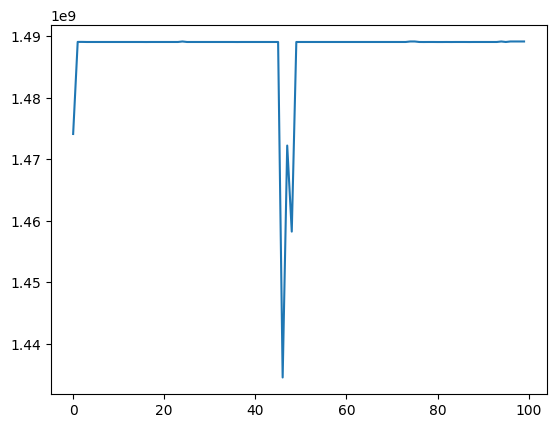

In [190]:
import matplotlib.pyplot as plt

plt.plot(y[:100])

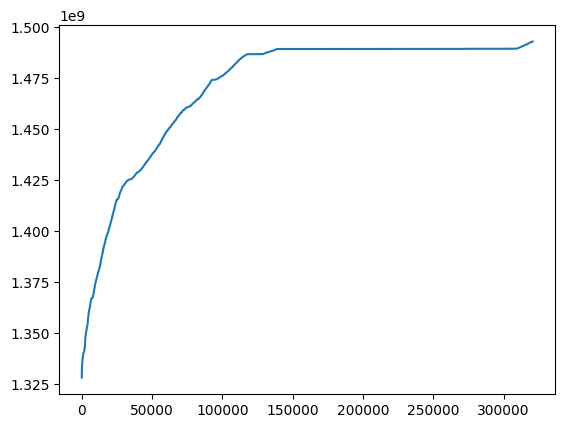

In [193]:
import numpy as np
plt.plot(np.sort(y))

<Axes: xlabel='created_datetime', ylabel='Proportion'>

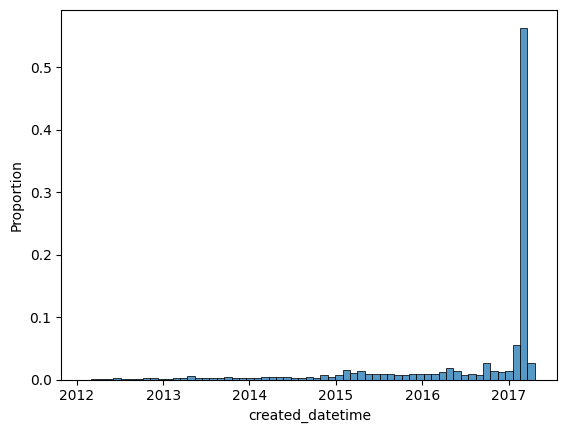

In [158]:
my_bins = pd.date_range(start=df['created_datetime'].min(),end=df['created_datetime'].max(),freq='ME')
sns.histplot(df, x='created_datetime', stat='proportion', binwidth=len(my_bins)//2)

In [140]:
df['Year'] = df["created_datetime"].dt.year
df['Month'] = df["created_datetime"].dt.month

histo = df.groupby([df["Year"], df["Month"]])['created_datetime'].sum().plot(kind="bar")

TypeError: datetime64 type does not support sum operations

In [47]:
sns.histo.reset_index()

,Year,Month,created_datetime
0,2012.0,1.0,1
1,2012.0,2.0,13
2,2012.0,3.0,170
3,2012.0,4.0,222
4,2012.0,5.0,458
5,2012.0,6.0,905
6,2012.0,7.0,516
7,2012.0,8.0,164
8,2012.0,9.0,460
9,2012.0,10.0,583


In [44]:
one.to_frame()

created_datetime
created_datetime created_datetime                  
2012.0           1.0                              1
                 2.0                             13
                 3.0                            170
                 4.0                            222
                 5.0                            458
                 6.0                            905
                 7.0                            516
                 8.0                            164
                 9.0                            460
                 10.0                           583
                 11.0                           663
                 12.0                           353
2013.0           1.0                            437
                 2.0                            709
                 3.0                            604
                 4.0                           1515
                 5.0                            751
                 6.0                            743
                 7.0                            782
                 8.0                           1013
                 9.0                           1066
                 10.0                          1008
                 11.0                           659
                 12.0                           875
2014.0           1.0                            734
                 2.0                            875
                 3.0                            936
                 4.0                           1321
                 5.0                           1121
                 6.0                           1050
                 7.0                            905
                 8.0                           1142
                 9.0                            859
                 10.0                          1012
                 11.0                          2120
                 12.0                          1476
2015.0           1.0                           2272
                 2.0                           4251
                 3.0                           3819
                 4.0                           4195
                 5.0                           2749
                 6.0                           2811
                 7.0                           2873
                 8.0                           2732
                 9.0                           2438
                 10.0                          2053
                 11.0                          2367
                 12.0                          3071
2016.0           1.0                           3122
                 2.0                           2545
                 3.0                           3669
                 4.0                           5562
                 5.0                           4706
                 6.0                           2617
                 7.0                           2583
                 8.0                           2810
                 9.0                           6911
                 10.0                          5303
                 11.0                          3995
                 12.0                          3694
2017.0           1.0                           4905
                 2.0                          19984
                 3.0                         179096
                 4.0                           5394

In [76]:
df['origins'].dropna().str.lower().str.split(',').str[-1].value_counts()

origins
france                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [78]:
df['creator'].value_counts()

creator
usda-ndb-import                                                         169868
openfoodfacts-contributors                                               40117
kiliweb                                                                  13891
date-limite-app                                                          11918
openfood-ch-import                                                       11478
tacite                                                                    7214
sebleouf                                                                  5864
tacinte                                                                   4398
javichu                                                                   2768
stephane                                                                  2691
teolemon                                                                  2334
agamitsudo                                                                2042
twoflower                                   

In [23]:
df_import = df[df['creator'] == 'usda-ndb-import']

KeyError: 'creator'

In [105]:
df_import.sort_values(by='created_t').reset_index(inplace=True)

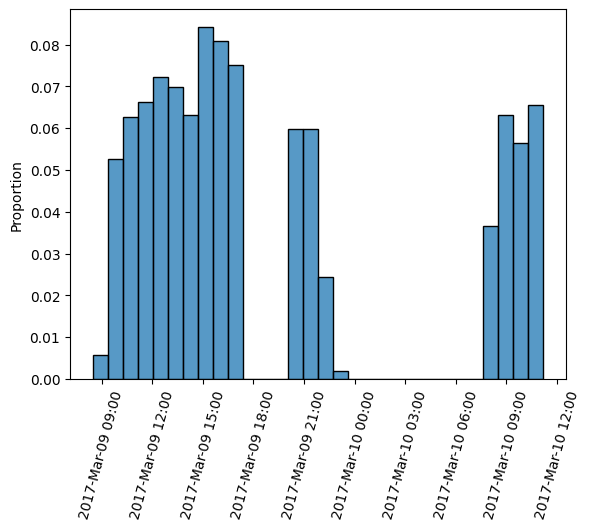

In [137]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%Y-%b-%d %H:%M')

fig, ax = plt.subplots()
sns.histplot(df_import, x='created_datetime', stat='proportion', bins=30)
ax.set_xlabel('')
ax.xaxis.set_major_formatter(myFmt)
ax.tick_params(axis='x', rotation=75)

<Axes: >

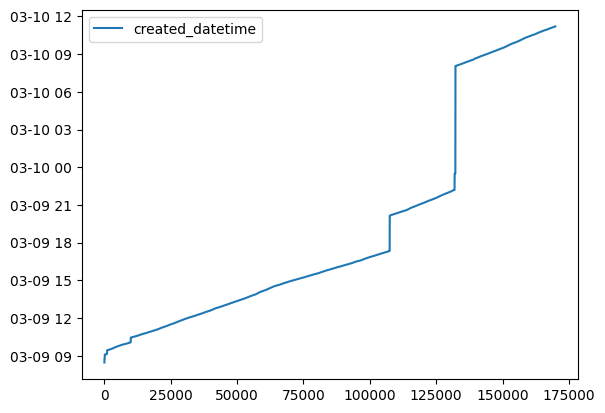

In [107]:
df_import.sort_values(by=['created_t']).reset_index().plot(y='created_datetime')

In [160]:
df['created_datetime'].iloc[0].date

<bound method Timestamp.date of Timestamp('2016-09-17 09:17:46')>

In [22]:
df_import.histplot(x='nutrition-score-fr_100g')

NameError: name 'df_import' is not defined

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

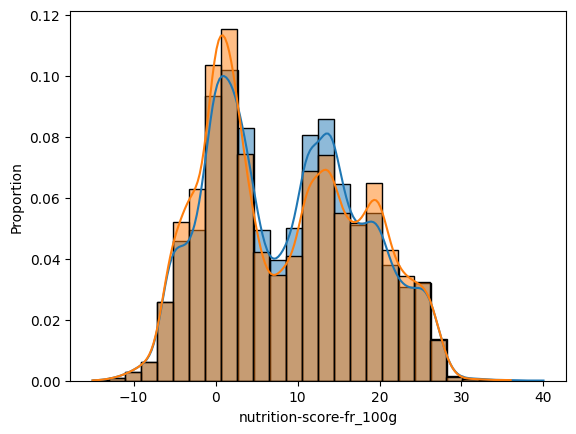

In [17]:
sns.histplot(df[df['creator'] != 'usda-ndb-import'], x='nutrition-score-fr_100g', stat='proportion', kde=True, label='', alpha=0.5, binwidth=2)
sns.histplot(df[df['creator'] != 'usda-ndb-import'], x='nutrition-score-uk_100g',  stat='proportion', kde=True, alpha=0.5, binwidth=2)

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

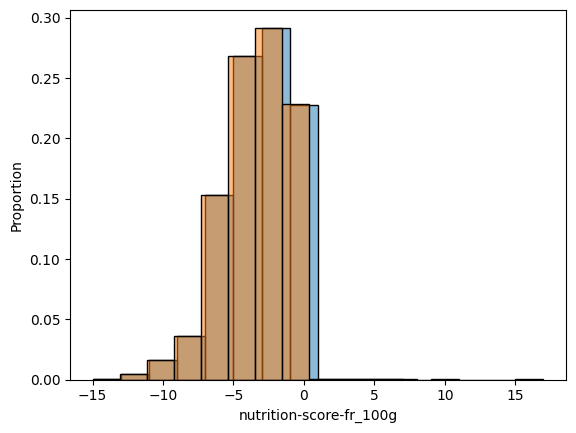

In [214]:
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'a')], stat='proportion', x='nutrition-score-fr_100g', label='', alpha=0.5, binwidth=2)
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'a')],  stat='proportion',x='nutrition-score-uk_100g', alpha=0.5, binwidth=2)

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

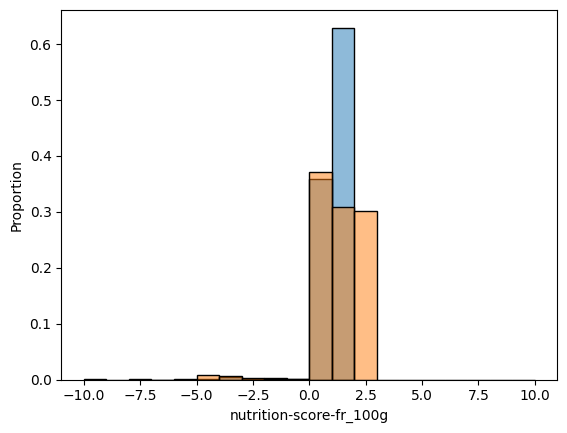

In [215]:
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'b')], x='nutrition-score-fr_100g', stat='proportion', label='', alpha=0.5, binwidth=1)
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'b')], x='nutrition-score-uk_100g',  stat='proportion', alpha=0.5, binwidth=1)

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

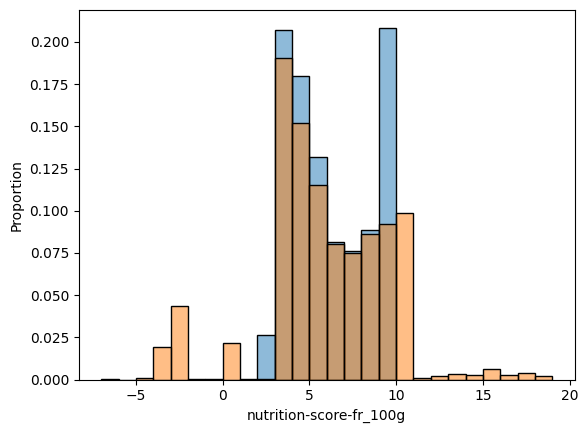

In [216]:
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'c')],  stat='proportion', x='nutrition-score-fr_100g', label='', alpha=0.5, binwidth=1)
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'c')],  stat='proportion', x='nutrition-score-uk_100g', alpha=0.5, binwidth=1)

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

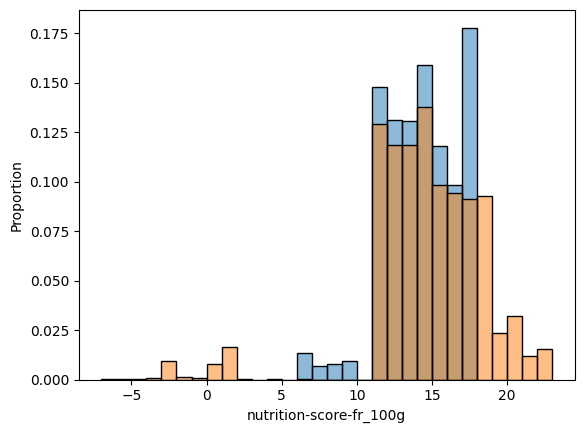

In [217]:
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'd')],  stat='proportion', x='nutrition-score-fr_100g', label='', alpha=0.5, binwidth=1)
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'd')],  stat='proportion', x='nutrition-score-uk_100g', alpha=0.5, binwidth=1)

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

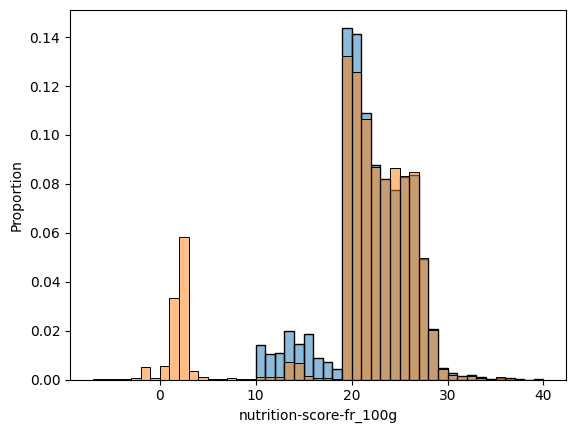

In [219]:
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'e')], stat='proportion', x='nutrition-score-fr_100g', label='', alpha=0.5, binwidth=1)
sns.histplot(df[(df['creator'] != 'usda-ndb-import') & (df['nutrition_grade_fr'] == 'e')], stat='proportion', x='nutrition-score-uk_100g', alpha=0.5, binwidth=1)

In [26]:
from scipy import stats

df_scores = df[['creator', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g']].copy()
df_scores = df_scores[df_scores['creator'] != 'usda-ndb-import']
df_scores.reset_index(inplace=True)
df_scores.dropna(inplace=True)

sample_1 = df_scores['nutrition-score-fr_100g'].to_numpy()
sample_2 = df_scores['nutrition-score-uk_100g'].to_numpy()

In [27]:
res = stats.ks_2samp(sample_1, sample_2, alternative='two-sided')
res

KstestResult(statistic=np.float64(0.04334043113142094), pvalue=np.float64(1.1651689444799712e-68), statistic_location=np.float64(2.0), statistic_sign=np.int8(-1))

In [28]:
res = stats.anderson_ksamp([sample_1[:10000], sample_2[:10000]], method=stats.PermutationMethod())
res

Anderson_ksampResult(statistic=np.float64(8.900789630462889), critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), pvalue=np.float64(0.0001))

In [29]:
res = stats.cramervonmises_2samp(sample_1, sample_2)
res

CramerVonMisesResult(statistic=20.38640538341133, pvalue=1.1868150906479968e-09)

<Axes: xlabel='nutrition-score-fr_100g', ylabel='Proportion'>

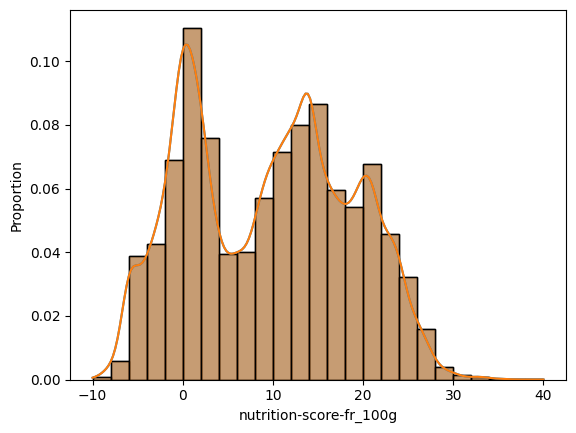

In [220]:
sns.histplot(df[(df['creator'] == 'usda-ndb-import')], x='nutrition-score-fr_100g', stat='proportion', kde=True, label='', alpha=0.5, binwidth=2)
sns.histplot(df[(df['creator'] == 'usda-ndb-import')], x='nutrition-score-uk_100g',  stat='proportion', kde=True, alpha=0.5, binwidth=2)

# Question 18

In [403]:
tags = {}
df['labels_tags'] = df['labels_tags'].replace(to_replace=r'\w\w:|eu-', value='', regex=True)
for x in df['labels_tags'].str.split(','):
    if isinstance(x, float) : continue 
    for label in set(x):
        if len(label) > 3:
            try :
                tags[label][0] += 1
            except KeyError :
                tags[label] = [1]
        

In [404]:
df_tags = pd.DataFrame.from_dict(tags).transpose().reset_index()
df_tags.columns = ['Label', 'Count']

In [405]:
df_tags.sort_values(by='Count', inplace=True, ascending=False)
df_tags.reset_index(drop=True, inplace=True)

([0, 1, 2, 3, 4, 5, 6, 7],
 [Text(0, 0, 'organic'),
  Text(1, 0, 'ab-agriculture-biologique'),
  Text(2, 0, 'green-dot'),
  Text(3, 0, 'vegetarian'),
  Text(4, 0, 'vegan'),
  Text(5, 0, 'no-preservatives'),
  Text(6, 0, 'eco-emballages'),
  Text(7, 0, 'gluten-free')])

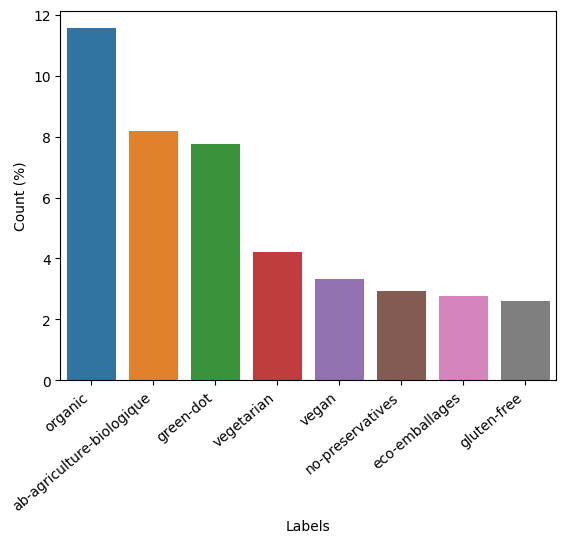

In [509]:
fig, ax = plt.subplots()
l_thr = 3000
sns.barplot(df_tags[df_tags['Count'] > l_thr], x='Label', y='Count', hue='Label', estimator=lambda x: 100*sum(x)/df_tags['Count'].sum())
#ax.tick_params(axis='x', rotation=75, ha='right')
plt.ylabel('Count (%)')
plt.xlabel('Labels')
plt.xticks(rotation=40, ha='right')

In [409]:
df2 = df.dropna(subset=['labels_tags', 'nutrition_grade_fr']).reset_index()[['labels_tags', 'nutrition_grade_fr']]


df2[df2['labels_tags'].str.contains(r'organic') == True].groupby(['nutrition_grade_fr']).count()

,labels_tags
nutrition_grade_fr,
a,3035
b,1988
c,2104
d,2503
e,1383


In [410]:
df2[df2['labels_tags'].str.contains(r'organic') == True].groupby(['nutrition_grade_fr']).count()

,labels_tags
nutrition_grade_fr,
a,3035
b,1988
c,2104
d,2503
e,1383


In [413]:
df2[df2['labels_tags'].str.contains(r'ab-agriculture-biologique') == True].groupby(['nutrition_grade_fr']).count()

,labels_tags
nutrition_grade_fr,
a,2292
b,1497
c,1580
d,1826
e,1080


In [520]:
label_list = df_tags.loc[df_tags['Count'] > l_thr, 'Label'].tolist()

print(label_list)
label_list.remove('green-dot')
label_list.remove('eco-emballages')

['organic', 'ab-agriculture-biologique', 'green-dot', 'vegetarian', 'vegan', 'no-preservatives', 'eco-emballages', 'gluten-free']


In [511]:
hash_labels_grades = {'label': [], 'grade' : [], 'count' : []}#{'nutrition-grade' : [,"c","d","e"]}
df_lg = pd.DataFrame(hash_labels_grades)
scores =  ['a', 'b',"c","d","e"]
df_lg = pd.DataFrame(hash_labels_grades)
for l in label_list :
    count = df2[df2['labels_tags'].str.contains(l) == True].groupby(['nutrition_grade_fr']).count()['labels_tags'].to_numpy(dtype=np.float64)
    #count /= count.sum()
    for i in range(5):
        df_lg = pd.concat([df_lg, pd.DataFrame({'label': [l], 'grade' : [scores[i]], 'count' : [count[i]]})])
    hash_labels_grades[l] = count.tolist()

In [512]:
#.transpose().reset_index()


In [513]:
df_lg.head()

,label,grade,count
0,organic,a,3035.0
0,organic,b,1988.0
0,organic,c,2104.0
0,organic,d,2503.0
0,organic,e,1383.0


([0, 1, 2, 3, 4, 5, 6, 7],
 [Text(0, 0, 'organic'),
  Text(1, 0, 'ab-agriculture-biologique'),
  Text(2, 0, 'green-dot'),
  Text(3, 0, 'vegetarian'),
  Text(4, 0, 'vegan'),
  Text(5, 0, 'no-preservatives'),
  Text(6, 0, 'eco-emballages'),
  Text(7, 0, 'gluten-free')])

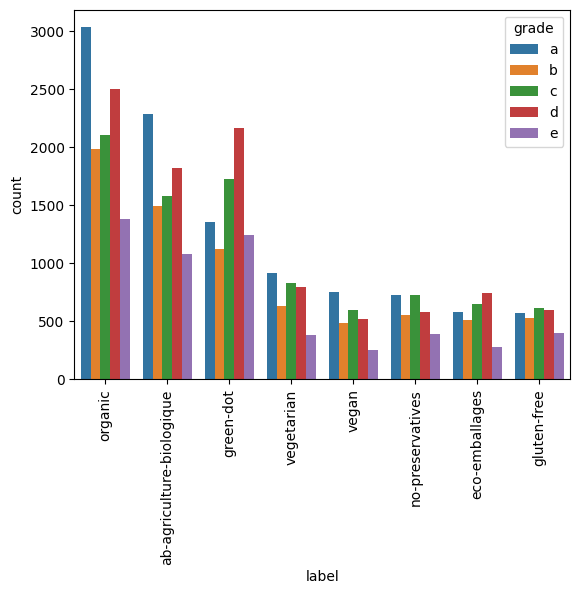

In [516]:
fig, ax = plt.subplots()

sns.barplot(df_lg, x ='label', y='count', hue='grade')
plt.xticks(rotation=90, ha='center')

# Question 19

In [594]:
df_cc = df['creator'].value_counts().reset_index()
df_cc.head(20)

,creator,count
0,usda-ndb-import,169868
1,openfoodfacts-contributors,40117
2,kiliweb,13891
3,date-limite-app,11918
4,openfood-ch-import,11478
5,tacite,7214
6,sebleouf,5864
7,tacinte,4398
8,javichu,2768
9,stephane,2691


In [597]:
thr_c = 1000
df_cc = df_cc[df_cc['count'] > thr_c]
print(df_cc.shape)

(19, 2)


In [598]:

for c in df_cc['creator']:
    df_cc.loc[df_cc['creator'] ==c,'filling_rate']= df[df['creator'] == c].count(axis=1).reset_index(drop=True).mean()/df.shape[1]
    

In [599]:
df_cc.shape

(19, 3)

In [600]:
df[df['creator'] == 'teolemon'].count(axis=1).reset_index(drop=True).mean()

np.float64(34.06726649528706)

In [546]:
df.shape

(320749, 76)

In [601]:
df_cc[df_cc['creator'] == 'teolemon']

,creator,count,filling_rate
10,teolemon,2334,0.448254


In [629]:
df['filling_rate'] = 100*df.count(axis=1)/df.shape[1]
df.sort_values(by='created_t', inplace=True)

In [ ]:
sns.lineplot(df.loc, x ='created_t', y='filling_rate', ci=None)

In [633]:
xxx = df['created_t'].to_numpy()
yyy = df['filling_rate'].to_numpy()

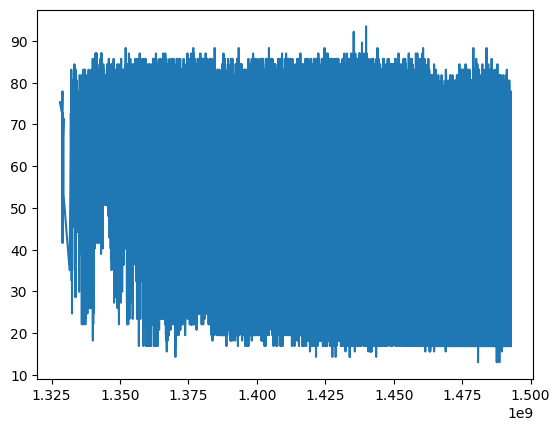

In [637]:
plt.plot(xxx[1:], yyy[1:])